# Team Emoti-EEG Pre-Processing: Experiment 1 and Experiment 2


## Experiment 1 Pre-Processing

**Neutral and Sad Manipulations:**
- Subject 1 (Female/Neutral Stimulus)

- Subject 2 (Male/Neutral Stimulus)

- Subject 3 (Female/Sad Stimulus)

- Subject 4 (Male/Sad Stimulus)

#### Import Packages

In [1]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib notebook

### Take a Look At Experiment 1 Logistics

In [2]:
experiment_1_logistics = pd.read_csv("participants.tsv",  sep='\t')
experiment_1_logistics.head(4)

,participant_id,MoodManipulationGroup,sex,age,BDI
0,sub-001,Neutral,Female,21,10
1,sub-002,Neutral,Male,26,11
2,sub-003,Sad,Female,36,11
3,sub-004,Sad,Male,33,4


## Subject 1 (Female/Neutral Stimulus)

In [3]:
subj1 = mne.io.read_raw_eeglab("sub-001-eeg-sub-001_task-PST_eeg.set", preload = True)
df = subj1.to_data_frame()

Reading /home/cmcmanig/FINALPROJECT/sub-001-eeg-sub-001_task-PST_eeg.fdt
Reading 0 ... 754924  =      0.000 ...  1509.848 secs...


/tmp/ipykernel_973/3126423245.py:1: RuntimeWarning: Data file name in EEG.data (sub-001_task-PST_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-001-eeg-sub-001_task-PST_eeg.fdt).
  subj1 = mne.io.read_raw_eeglab("sub-001-eeg-sub-001_task-PST_eeg.set", preload = True)
/tmp/ipykernel_973/3126423245.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  subj1 = mne.io.read_raw_eeglab("sub-001-eeg-sub-001_task-PST_eeg.set", preload = True)


In [4]:
df.head()

,time,Fp1,Fz,F3,F7,FT9,FC5,FC1,C3,T7,...,C2,FC4,FT8,F6,F2,AF4,AF8,EOG,EKG,AudioOutput
0,0.000,-2517.822266,8277.929688,10931.933594,6093.945312,5324.902344,33134.714844,5345.117188,6895.947266,11763.232422,...,3279.541016,-9313.378906,4911.621094,-576.367188,674.853516,4801.904297,-1931.542969,12462.138672,2334804.25,1947.879761
1,0.002,-2516.406250,8279.687500,10931.933594,6087.109375,5326.464844,33143.894531,5346.386719,6899.804687,11761.474609,...,3279.492187,-9315.673828,4910.449219,-579.150391,673.925781,4807.617188,-1934.765625,12428.760742,2393273.75,1402.497314
2,0.004,-2516.406250,8281.884766,10938.134766,6086.279297,5335.937500,33142.917969,5347.949219,6899.755859,11762.158203,...,3280.517578,-9315.234375,4919.238281,-574.658203,674.853516,4819.775391,-1933.740234,12343.526367,2464593.75,1501.142944
3,0.006,-2516.552734,8280.322266,10933.447266,6088.232422,5332.031250,33130.320312,5346.386719,6894.824219,11765.625000,...,3279.150391,-9315.136719,4916.748047,-572.314453,675.146484,4798.974609,-1939.990234,12350.082031,2508445.50,958.442688
4,0.008,-2512.988281,8281.054688,10933.056641,6092.529297,5328.613281,33122.167969,5347.314453,6893.701172,11770.019531,...,3278.906250,-9312.890625,4913.818359,-564.501953,676.318359,4791.308594,-1939.501953,12445.151367,2502874.25,1991.689209


#### Look at Recording Logistics

In [5]:
num_chan = subj1.info['nchan']
srate = subj1.info['sfreq']
num_time_pnts = subj1.n_times
duration = subj1.n_times / srate

print('Number of channels:', num_chan)
print('Sampling rate:', srate, "Hz")
print('Numer of time points:', num_time_pnts)
print('Duration:', duration, "seconds")

Number of channels: 66
Sampling rate: 500.0 Hz
Numer of time points: 754925
Duration: 1509.85 seconds


In [6]:
subj1.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, Pz, P3, ...
 chs: 66 EEG
 custom_ref_applied: False
 dig: 69 items (3 Cardinal, 66 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 66
 projs: []
 sfreq: 500.0 Hz
>

### Take a Look at Channels, Change Type of non-EEG channels, and Remove "Bad" Channels

In [7]:
# need to change channel type of non-EEG channels
subj1.info['ch_names']

['Fp1',
 'Fz',
 'F3',
 'F7',
 'FT9',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'TP9',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'TP10',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'FT10',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'FCz',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'F2',
 'AF4',
 'AF8',
 'EOG',
 'EKG',
 'AudioOutput']

In [8]:
channel_change = { 'EOG' : 'misc',
                   'EKG' : 'misc',
           'AudioOutput' : 'misc' } # non-EEG channels to misc

bad_channels = ['P4', 'CP3', 'FT10', 'TP10', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects

subj1.set_channel_types(channel_change)
subj1.drop_channels(bad_channels)

subj1.set_montage('standard_1020', match_case = False) # set montage

/tmp/ipykernel_973/751496083.py:7: RuntimeWarning: The unit for channel(s) AudioOutput, EKG, EOG has changed from V to NA.
  subj1.set_channel_types(channel_change)


<RawEEGLAB | sub-001-eeg-sub-001_task-PST_eeg.fdt, 53 x 754925 (1509.8 s), ~305.3 MB, data loaded>

### Plot the Raw Data and Power Spectrum
**Subject 1 Original Channels marked as bad**: P4, CP3, FT10, TP10, and FC6

- The Power Spectrum Density plot revealed that channels P4, CP3, FT10, TP10, and FC6 were outliers and should therefore be removed from our analysis due to being too noisy. However, after our first iteration of pre-processing, we used the drop channels call to remove all bad channels across our 6 subjects. This left us with 50 good EEG channels for subjects in experiment 1.

Using matplotlib as 2D backend.


<IPython.core.display.Javascript object>


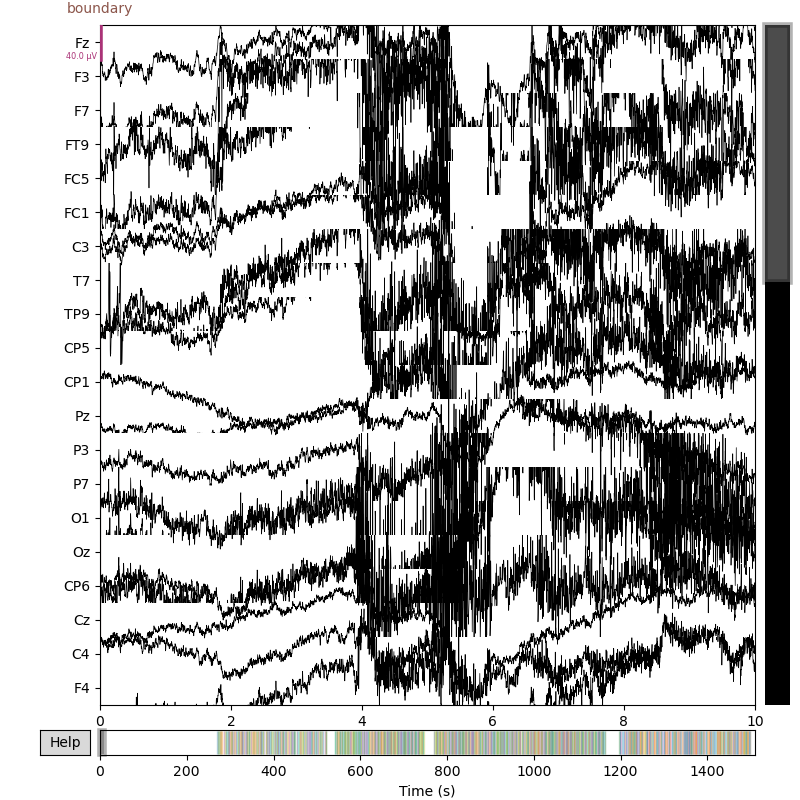

In [9]:
# plot raw data

mne.viz.plot_raw(subj1, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


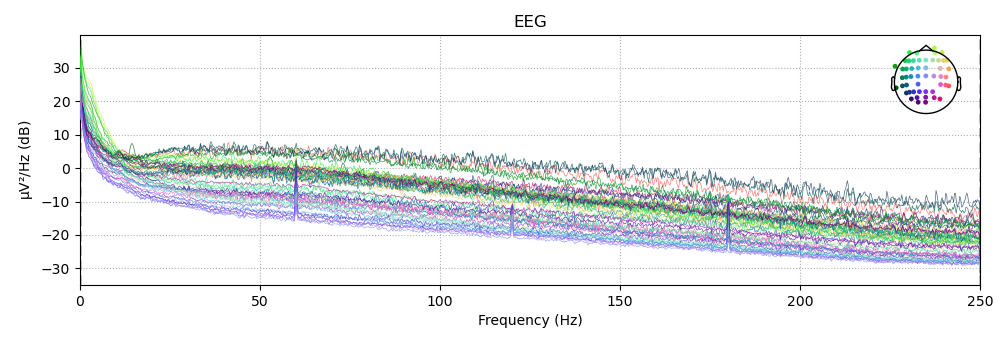

In [10]:
# plot power spectrum

subj1.plot_psd(show = False)

### Re-Referencing Subject 1

In [11]:
# re-reference
subj1.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-001-eeg-sub-001_task-PST_eeg.fdt, 53 x 754925 (1509.8 s), ~305.3 MB, data loaded>

### Filtering Subject 1
**Filter**: We will use a high pass-filter with a cutoff at 0.1 Hz across all of our subjects. We choose a cutoff of 0.1 Hz because neural signals oscillating below 0.1 Hz might be a recording corrupted by sweat. Effectively, this will remove unnecessary drift within our EEG data and isolate the high frequencies that we care about. In addition, we used a notch filter(band stop filter) to zero out the line noise at 60 Hz and its harmonics.

In [12]:
subj1 = subj1.filter(l_freq = 0.1, h_freq = None) # high pass filter with cutoff 0.1 Hz

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 16501 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.7s finished


In [13]:
subj1_filtered = subj1.notch_filter((np.arange(60, 241, 60))) # band stop filter removing line noise and harmonics

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.3s finished


<IPython.core.display.Javascript object>


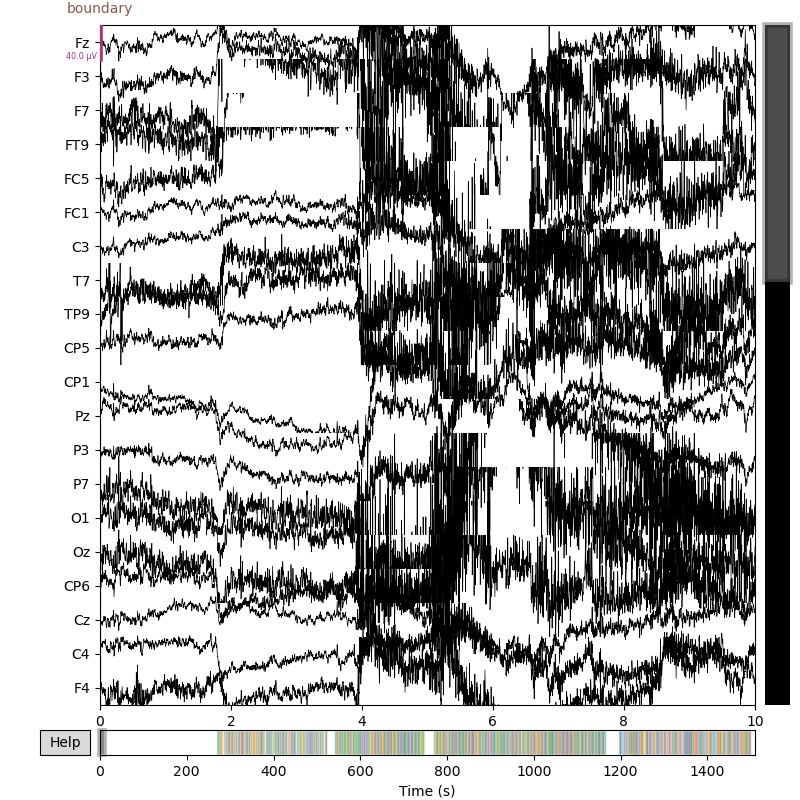

In [14]:
#raw.plot()

mne.viz.plot_raw(subj1_filtered, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


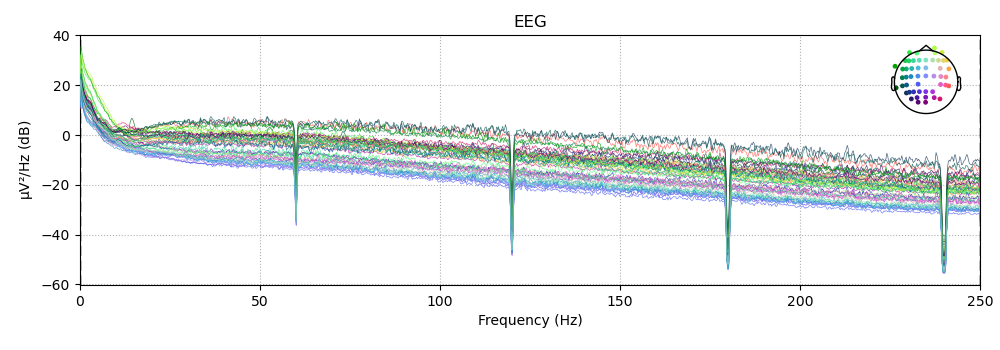

In [15]:
subj1_filtered.plot_psd(show = False)

In [16]:
subj1_filtered.save("/home/cmcmanig/FINALPROJECT/subj1_exp1_female_neutral_filtered.fif", overwrite = True)

Overwriting existing file.
Writing /home/cmcmanig/FINALPROJECT/subj1_exp1_female_neutral_filtered.fif


/tmp/ipykernel_973/831216192.py:1: RuntimeWarning: This filename (/home/cmcmanig/FINALPROJECT/subj1_exp1_female_neutral_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  subj1_filtered.save("/home/cmcmanig/FINALPROJECT/subj1_exp1_female_neutral_filtered.fif", overwrite = True)


Closing /home/cmcmanig/FINALPROJECT/subj1_exp1_female_neutral_filtered.fif
[done]


## Subject 2 (Male/Neutral Stimulus)

In [17]:
subj2 = mne.io.read_raw_eeglab("sub-002-eeg-sub-002_task-PST_eeg.set", preload = True)
df2 = subj2.to_data_frame()

Reading /home/cmcmanig/FINALPROJECT/sub-002-eeg-sub-002_task-PST_eeg.fdt
Reading 0 ... 711649  =      0.000 ...  1423.298 secs...


/tmp/ipykernel_973/3184058491.py:1: RuntimeWarning: Data file name in EEG.data (sub-002_task-PST_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-002-eeg-sub-002_task-PST_eeg.fdt).
  subj2 = mne.io.read_raw_eeglab("sub-002-eeg-sub-002_task-PST_eeg.set", preload = True)
/tmp/ipykernel_973/3184058491.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  subj2 = mne.io.read_raw_eeglab("sub-002-eeg-sub-002_task-PST_eeg.set", preload = True)


In [18]:
df2.head()

,time,Fp1,Fz,F3,F7,FT9,FC5,FC1,C3,T7,...,C2,FC4,FT8,F6,F2,AF4,AF8,EOG,EKG,AudioOutput
0,0.000,8236.914062,6354.248047,-4890.576172,-3798.535156,3923.583984,2251.513672,2748.974609,2091.650391,-9330.468750,...,3876.904297,-4536.132812,-16221.679688,-5243.212891,2729.492188,-4505.322266,1793.847656,12314.617188,454191.28125,4537.403809
1,0.002,8250.878906,6357.080078,-4898.681641,-3859.912109,3935.498047,2222.363281,2744.970703,2085.595703,-9366.308594,...,3876.513672,-4519.775391,-16230.810547,-5205.078125,2740.380859,-4488.867188,1813.525391,12332.499023,454244.62500,4221.796875
2,0.004,8236.816406,6351.611328,-4895.751953,-3813.427734,3862.841797,2233.349609,2744.531250,2090.039062,-9357.958984,...,3875.537109,-4511.572266,-16351.806641,-5215.234375,2735.205078,-4503.857422,1774.316406,12305.081055,454918.15625,2055.466064
3,0.006,8209.472656,6343.408203,-4897.412109,-3791.113281,3927.294922,2233.007812,2746.435547,2094.189453,-9338.378906,...,3873.339844,-4529.101562,-16345.263672,-5228.417969,2723.974609,-4520.800781,1758.398438,12012.124023,456227.96875,1876.056152
4,0.008,8216.357422,6339.697266,-4910.986328,-3834.521484,3930.468750,2201.025391,2739.208984,2085.302734,-9379.785156,...,3874.853516,-4516.259766,-16357.177734,-5221.875000,2726.855469,-4527.880859,1751.171875,11951.029297,456358.50000,2605.020996


#### Look at Recording Logistics

In [19]:
num_chan = subj2.info['nchan']
srate = subj2.info['sfreq']
num_time_pnts = subj2.n_times
duration = subj2.n_times / srate

print('Number of channels:', num_chan)
print('Sampling rate:', srate, "Hz")
print('Numer of time points:', num_time_pnts)
print('Duration:', duration, "seconds")

Number of channels: 66
Sampling rate: 500.0 Hz
Numer of time points: 711650
Duration: 1423.3 seconds


In [20]:
subj2.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, Pz, P3, ...
 chs: 66 EEG
 custom_ref_applied: False
 dig: 69 items (3 Cardinal, 66 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 66
 projs: []
 sfreq: 500.0 Hz
>

### Take a Look at Channels, Change Type of non-EEG channels, and Reomve "Bad" Channels

In [21]:
# need to change channel type of non-EEG channels
subj2.info['ch_names']

['Fp1',
 'Fz',
 'F3',
 'F7',
 'FT9',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'TP9',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'TP10',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'FT10',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'FCz',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'F2',
 'AF4',
 'AF8',
 'EOG',
 'EKG',
 'AudioOutput']

In [22]:
channel_change = { 'EOG' : 'misc',
                   'EKG' : 'misc',
           'AudioOutput' : 'misc' } # non-EEG channels to misc

bad_channels = ['P4', 'CP3', 'FT10', 'TP10', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects

subj2.set_channel_types(channel_change)
subj2.drop_channels(bad_channels)

subj2.set_montage('standard_1020', match_case = False) # set montage

/tmp/ipykernel_973/3356122511.py:7: RuntimeWarning: The unit for channel(s) AudioOutput, EKG, EOG has changed from V to NA.
  subj2.set_channel_types(channel_change)


<RawEEGLAB | sub-002-eeg-sub-002_task-PST_eeg.fdt, 53 x 711650 (1423.3 s), ~287.8 MB, data loaded>

### Plot the Raw Data and Power Spectrum
**Subject 2 Original Channels marked as bad**: O2, FC2, TP10, AFz and P6

- The Power Spectrum Density plot revealed that channels O2, FC2, TP10, AFz, and P6 were outliers and should therefore be removed from our analysis due to being too noisy. However, after our first iteration of pre-processing, we used the drop channels call to remove all bad channels across our 6 subjects. This left us with 50 good EEG channels for subjects in experiment 1. 

<IPython.core.display.Javascript object>


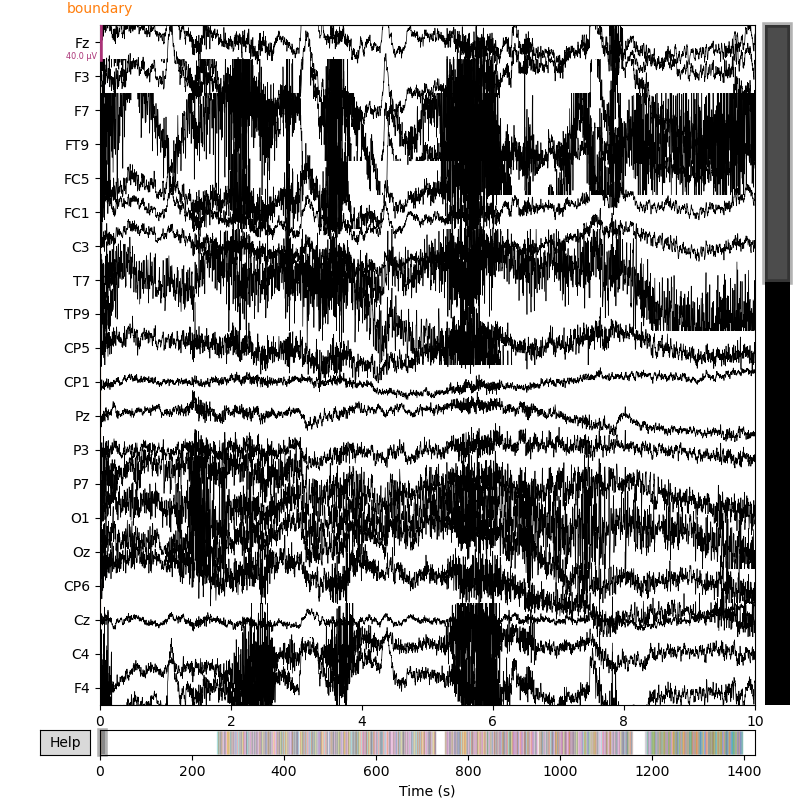

In [23]:
# plot raw data

mne.viz.plot_raw(subj2, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


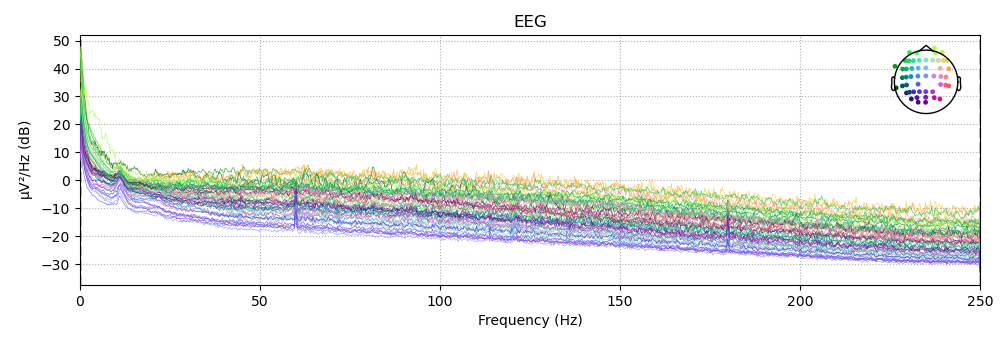

In [24]:
# plot power spectrum

subj2.plot_psd(show = False)

### Re-Referencing Subject 2

In [25]:
# re-reference
subj2.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-002-eeg-sub-002_task-PST_eeg.fdt, 53 x 711650 (1423.3 s), ~287.8 MB, data loaded>

### Filtering Subject 2
**Filter**: We will use a high pass-filter with a cutoff at 0.1 Hz across all of our subjects. We choose a cutoff of 0.1 Hz because neural signals oscillating below 0.1 Hz might be a recording corrupted by sweat. Effectively, this will remove unnecessary drift within our EEG data and isolate the high frequencies that we care about. In addition, we used a notch filter(band stop filter) to zero out the line noise at 60 Hz and its harmonics.

In [26]:
subj2 = subj2.filter(l_freq = 0.1, h_freq = None) # high pass filter with a cutoff of 0.1 Hz

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 16501 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.6s finished


In [27]:
subj2_filtered = subj2.notch_filter((np.arange(60, 241, 60))) # band stop filter removing line noise and harmonics

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.5s finished


<IPython.core.display.Javascript object>


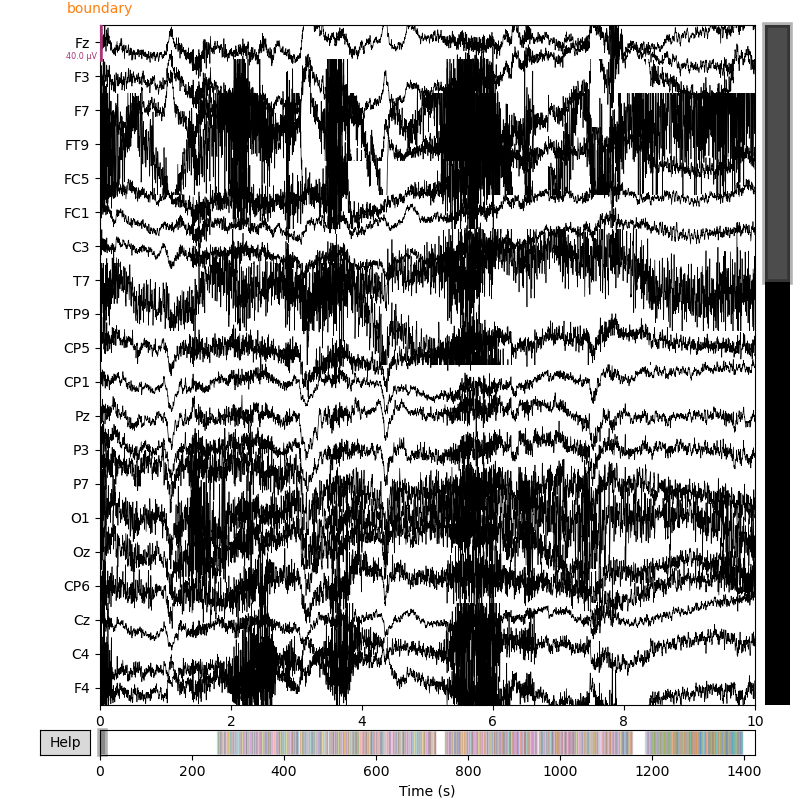

In [28]:
#raw.plot()

mne.viz.plot_raw(subj2_filtered, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


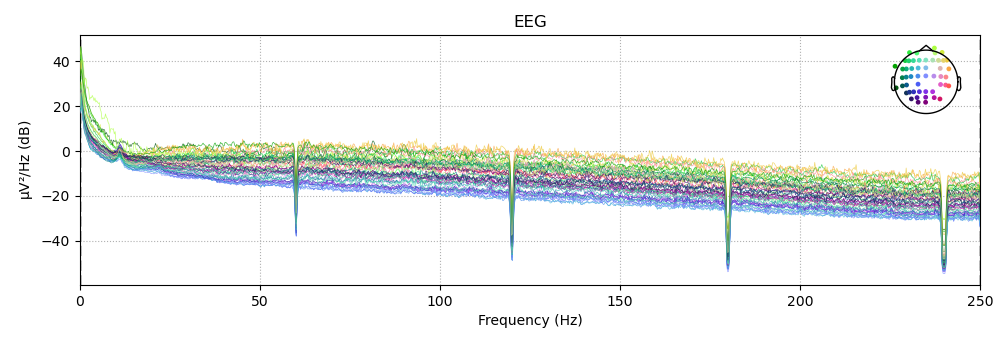

In [29]:
subj2_filtered.plot_psd(show = False)

In [30]:
subj2_filtered.save("/home/cmcmanig/FINALPROJECT/subj2_exp1_male_neutral_filtered.fif", overwrite = True)

Overwriting existing file.
Writing /home/cmcmanig/FINALPROJECT/subj2_exp1_male_neutral_filtered.fif


/tmp/ipykernel_973/3804595064.py:1: RuntimeWarning: This filename (/home/cmcmanig/FINALPROJECT/subj2_exp1_male_neutral_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  subj2_filtered.save("/home/cmcmanig/FINALPROJECT/subj2_exp1_male_neutral_filtered.fif", overwrite = True)


Closing /home/cmcmanig/FINALPROJECT/subj2_exp1_male_neutral_filtered.fif
[done]


## Subject 3 (Female/Sad Stimulus)

In [31]:
subj3 = mne.io.read_raw_eeglab("sub-003-eeg-sub-003_task-PST_eeg.set", preload = True)
df3 = subj3.to_data_frame()

Reading /home/cmcmanig/FINALPROJECT/sub-003-eeg-sub-003_task-PST_eeg.fdt
Reading 0 ... 632449  =      0.000 ...  1264.898 secs...


/tmp/ipykernel_973/2211051146.py:1: RuntimeWarning: Data file name in EEG.data (sub-003_task-PST_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-003-eeg-sub-003_task-PST_eeg.fdt).
  subj3 = mne.io.read_raw_eeglab("sub-003-eeg-sub-003_task-PST_eeg.set", preload = True)
/tmp/ipykernel_973/2211051146.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  subj3 = mne.io.read_raw_eeglab("sub-003-eeg-sub-003_task-PST_eeg.set", preload = True)


In [32]:
df3.head()

,time,Fp1,Fz,F3,F7,FT9,FC5,FC1,C3,T7,...,C2,FC4,FT8,F6,F2,AF4,AF8,EOG,EKG,AudioOutput
0,0.000,-18541.210938,-7359.912109,4180.078125,-4352.392578,3167.919922,-785.253906,3898.681641,15846.289062,-6301.757812,...,19704.101562,504.052734,4627.099609,-2538.330078,6395.556641,-2447.363281,-5677.246094,12338.757812,-343316.18750,1626.908813
1,0.002,-18543.945312,-7360.449219,4185.302734,-4356.933594,3170.800781,-787.060547,3898.925781,15842.480469,-6300.244141,...,19704.980469,505.566406,4631.542969,-2535.888672,6397.607422,-2443.750000,-5676.074219,12377.500977,-334857.09375,2858.936768
2,0.004,-18547.656250,-7362.597656,4169.091797,-4358.154297,3168.212891,-792.871094,3899.658203,15838.085938,-6272.851562,...,19705.615234,505.517578,4631.835937,-2537.011719,6396.533203,-2447.167969,-5676.123047,12331.903320,-334958.12500,2756.118652
3,0.006,-18545.019531,-7361.621094,4174.365234,-4349.218750,3173.144531,-794.287109,3901.464844,15838.525391,-6263.720703,...,19706.103516,506.201172,4631.591797,-2535.498047,6398.291016,-2446.289062,-5671.923828,12260.376953,-338972.21875,3007.352295
4,0.008,-18540.332031,-7362.402344,4177.636719,-4345.605469,3167.382812,-796.142578,3900.781250,15837.841797,-6265.673828,...,19704.638672,505.810547,4632.812500,-2533.691406,6397.216797,-2446.093750,-5669.433594,12275.875000,-352126.96875,2928.078125


#### Take a Look at Recording Logistics

In [33]:
num_chan = subj3.info['nchan']
srate = subj3.info['sfreq']
num_time_pnts = subj3.n_times
duration = subj3.n_times / srate

print('Number of channels:', num_chan)
print('Sampling rate:', srate, "Hz")
print('Numer of time points:', num_time_pnts)
print('Duration:', duration, "seconds")

Number of channels: 66
Sampling rate: 500.0 Hz
Numer of time points: 632450
Duration: 1264.9 seconds


In [34]:
subj3.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, Pz, P3, ...
 chs: 66 EEG
 custom_ref_applied: False
 dig: 69 items (3 Cardinal, 66 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 66
 projs: []
 sfreq: 500.0 Hz
>

### Take a Look at Channels, Change Type of non-EEG channels, and Remove "Bad" Channels

In [35]:
# need to change channel type of non-EEG channels
subj3.info['ch_names']

['Fp1',
 'Fz',
 'F3',
 'F7',
 'FT9',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'TP9',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'TP10',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'FT10',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'FCz',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'F2',
 'AF4',
 'AF8',
 'EOG',
 'EKG',
 'AudioOutput']

In [36]:
channel_change = { 'EOG' : 'misc',
                   'EKG' : 'misc',
           'AudioOutput' : 'misc' } # non-EEG channels to misc

bad_channels = ['P4', 'CP3', 'FT10', 'TP10', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects

subj3.set_channel_types(channel_change)
subj3.drop_channels(bad_channels)

subj3.set_montage('standard_1020', match_case = False) # set montage

/tmp/ipykernel_973/1354584997.py:7: RuntimeWarning: The unit for channel(s) AudioOutput, EKG, EOG has changed from V to NA.
  subj3.set_channel_types(channel_change)


<RawEEGLAB | sub-003-eeg-sub-003_task-PST_eeg.fdt, 53 x 632450 (1264.9 s), ~255.8 MB, data loaded>

### Plot the Raw Data and Power Spectrum
**Subject 3 Original Channel(s) marked as bad**: Fp1

- The Power Spectrum Density plot revealed that channel Fp1 was an outlier and should therefore be removed from our analysis due to being too noisy. However, after our first iteration of pre-processing, we used the drop channels call to remove all bad channels across our 6 subjects. This left us with 50 good EEG channels for subjects in experiment 1. 

<IPython.core.display.Javascript object>


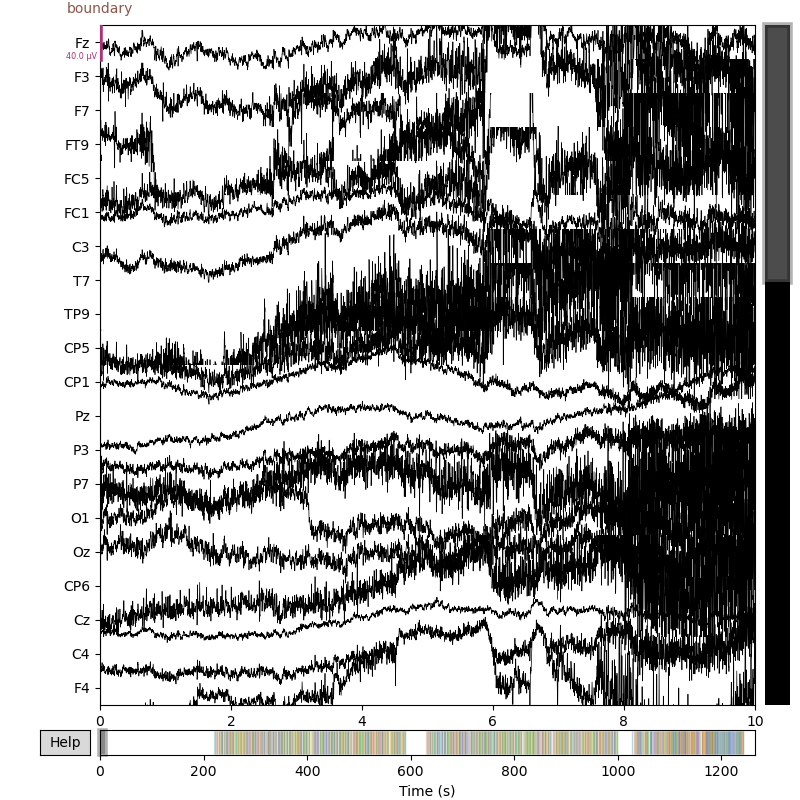

In [37]:
# plot raw data

mne.viz.plot_raw(subj3, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


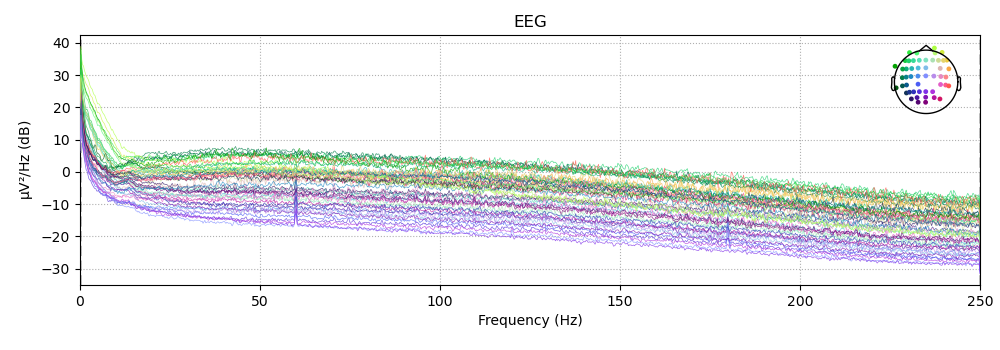

In [38]:
# plot power spectrum

subj3.plot_psd(show = False)

### Re-Referencing Subject 3

In [39]:
# re-reference
subj3.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-003-eeg-sub-003_task-PST_eeg.fdt, 53 x 632450 (1264.9 s), ~255.8 MB, data loaded>

### Filtering Subject 3
**Filter**: We will use a high pass-filter with a cutoff at 0.1 Hz across all of our subjects. We choose a cutoff of 0.1 Hz because neural signals oscillating below 0.1 Hz might be a recording corrupted by sweat. Effectively, this will remove unnecessary drift within our EEG data and isolate the high frequencies that we care about. In addition, we used a notch filter(band stop filter) to zero out the line noise at 60 Hz and its harmonics.

In [40]:
subj3 = subj3.filter(l_freq = 0.1, h_freq = None) # high pass filter with cutoff 0.1 Hz

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 16501 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.4s finished


In [41]:
subj3_filtered = subj3.notch_filter((np.arange(60, 241, 60))) # band stop filter removing line noise and harmonics

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.1s finished


<IPython.core.display.Javascript object>


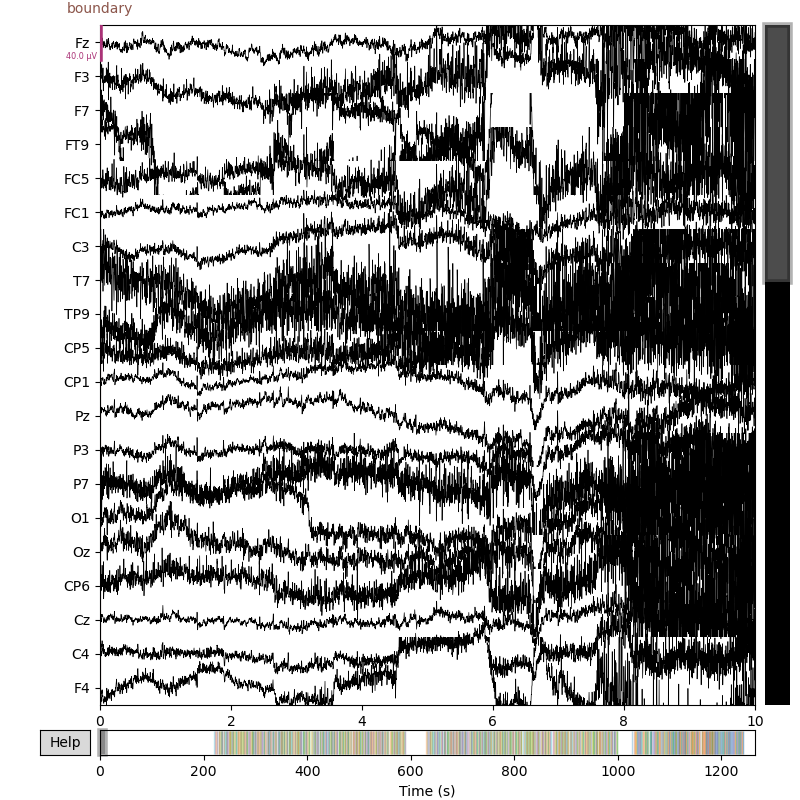

In [42]:
#raw.plot()

mne.viz.plot_raw(subj3_filtered, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


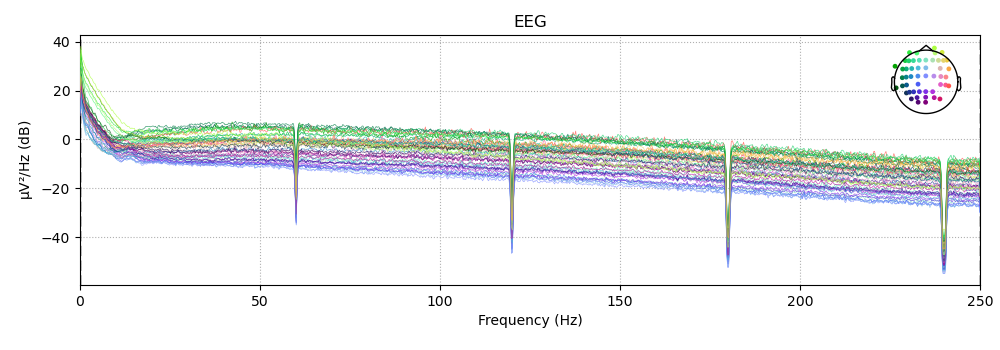

In [43]:
subj3_filtered.plot_psd(show = False)

In [44]:
subj3_filtered.save("/home/cmcmanig/FINALPROJECT/subj3_exp1_female_sad_filtered.fif", overwrite = True)

Overwriting existing file.
Writing /home/cmcmanig/FINALPROJECT/subj3_exp1_female_sad_filtered.fif


/tmp/ipykernel_973/1383249436.py:1: RuntimeWarning: This filename (/home/cmcmanig/FINALPROJECT/subj3_exp1_female_sad_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  subj3_filtered.save("/home/cmcmanig/FINALPROJECT/subj3_exp1_female_sad_filtered.fif", overwrite = True)


Closing /home/cmcmanig/FINALPROJECT/subj3_exp1_female_sad_filtered.fif
[done]


## Subject 4 (Male/Sad Stimulus)

In [45]:
subj4 = mne.io.read_raw_eeglab("sub-004-eeg-sub-004_task-PST_eeg.set", preload = True)
df4 = subj4.to_data_frame()

Reading /home/cmcmanig/FINALPROJECT/sub-004-eeg-sub-004_task-PST_eeg.fdt
Reading 0 ... 719474  =      0.000 ...  1438.948 secs...


/tmp/ipykernel_973/2207116890.py:1: RuntimeWarning: Data file name in EEG.data (sub-004_task-PST_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-004-eeg-sub-004_task-PST_eeg.fdt).
  subj4 = mne.io.read_raw_eeglab("sub-004-eeg-sub-004_task-PST_eeg.set", preload = True)
/tmp/ipykernel_973/2207116890.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  subj4 = mne.io.read_raw_eeglab("sub-004-eeg-sub-004_task-PST_eeg.set", preload = True)


In [46]:
df4.head()

,time,Fp1,Fz,F3,F7,FT9,FC5,FC1,C3,T7,...,C2,FC4,FT8,F6,F2,AF4,AF8,EOG,EKG,AudioOutput
0,0.000,-4098.486328,1809.716797,-17278.369141,-2002.832031,15007.568359,-10086.767578,-8082.617188,-335.791016,-11115.771484,...,-21361.669922,-17612.890625,-25342.187500,-22705.029297,-13918.994141,-17195.947266,-7545.312500,11960.864258,-616940.5625,740.587708
1,0.002,-4096.972656,1807.666016,-17278.857422,-2004.589844,15010.351562,-10083.300781,-8082.177734,-330.957031,-11108.447266,...,-21361.474609,-17612.109375,-25340.429688,-22707.373047,-13920.166016,-17196.435547,-7544.775391,11818.707031,-612731.0000,1564.025879
2,0.004,-4096.484375,1805.712891,-17283.447266,-2009.472656,15018.359375,-10092.333984,-8083.300781,-333.007812,-11110.595703,...,-21359.570312,-17609.716797,-25337.207031,-22704.589844,-13920.458984,-17197.314453,-7544.189453,11839.270508,-608489.1875,2486.109619
3,0.006,-4101.611328,1804.589844,-17285.253906,-2010.791016,15013.378906,-10095.800781,-8086.669922,-336.035156,-11113.232422,...,-21360.253906,-17610.791016,-25336.816406,-22705.615234,-13923.339844,-17199.560547,-7546.875000,11940.300781,-608934.1875,2962.648926
4,0.008,-4109.814453,1805.371094,-17287.011719,-2011.718750,15011.376953,-10094.531250,-8086.816406,-338.574219,-11110.693359,...,-21362.158203,-17610.644531,-25337.988281,-22708.837891,-13925.000000,-17202.978516,-7551.464844,11873.840820,-613029.0000,3454.685303


#### Take a Look at Recording Logistics

In [47]:
num_chan = subj4.info['nchan']
srate = subj4.info['sfreq']
num_time_pnts = subj4.n_times
duration = subj4.n_times / srate

print('Number of channels:', num_chan)
print('Sampling rate:', srate, "Hz")
print('Numer of time points:', num_time_pnts)
print('Duration:', duration, "seconds")

Number of channels: 66
Sampling rate: 500.0 Hz
Numer of time points: 719475
Duration: 1438.95 seconds


In [48]:
subj4.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, Pz, P3, ...
 chs: 66 EEG
 custom_ref_applied: False
 dig: 69 items (3 Cardinal, 66 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 66
 projs: []
 sfreq: 500.0 Hz
>

### Take a Look at Channels, Change Type of non-EEG channels, and Remove "Bad" Channels

In [49]:
# need to change channel type of non-EEG channels
subj4.info['ch_names']

['Fp1',
 'Fz',
 'F3',
 'F7',
 'FT9',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'TP9',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'TP10',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'FT10',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'FCz',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'F2',
 'AF4',
 'AF8',
 'EOG',
 'EKG',
 'AudioOutput']

In [50]:
channel_change = { 'EOG' : 'misc',
                   'EKG' : 'misc',
           'AudioOutput' : 'misc' } # non-EEG channels to misc

bad_channels = ['P4', 'CP3', 'FT10', 'TP10', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects

subj4.set_channel_types(channel_change)
subj4.drop_channels(bad_channels)

subj4.set_montage('standard_1020', match_case = False) # set montage

/tmp/ipykernel_973/3052484681.py:7: RuntimeWarning: The unit for channel(s) AudioOutput, EKG, EOG has changed from V to NA.
  subj4.set_channel_types(channel_change)


<RawEEGLAB | sub-004-eeg-sub-004_task-PST_eeg.fdt, 53 x 719475 (1438.9 s), ~291.0 MB, data loaded>

### Plot the Raw Data and Power Spectrum
**Subject 4 Original Channels marked as bad**: FT10, CP2, O2, and T8

- The Power Spectrum Density plot revealed that channels FT10, CP2, O2, and T8 were outliers and should therefore be removed from our analysis due to being too noisy. However, after our first iteration of pre-processing, we used the drop channels call to remove all bad channels across our 6 subjects. This left us with 50 good EEG channels for subjects in experiment 1.

<IPython.core.display.Javascript object>


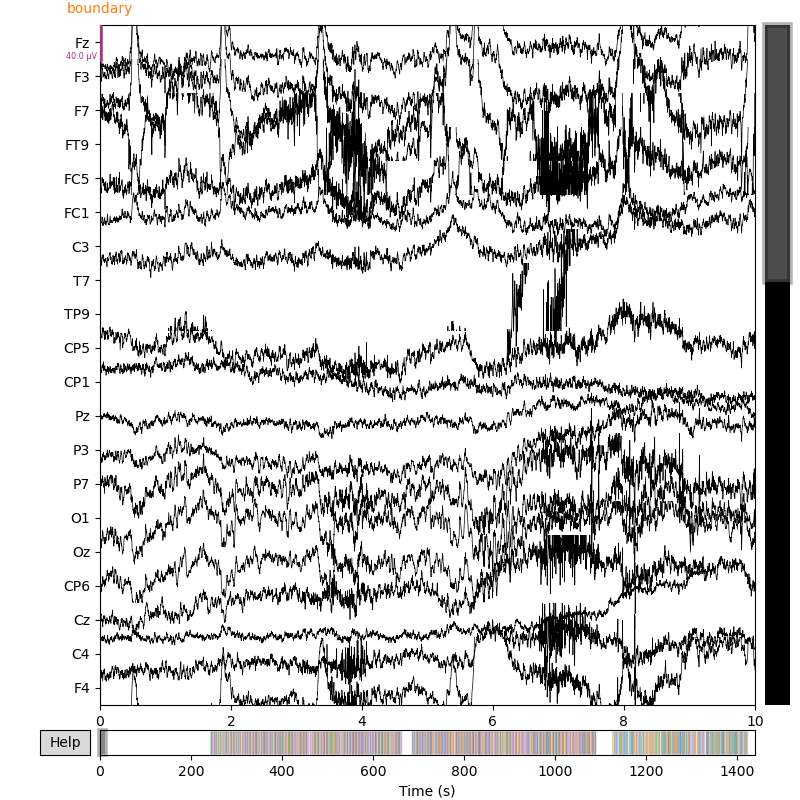

In [51]:
# plot raw data

mne.viz.plot_raw(subj4, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


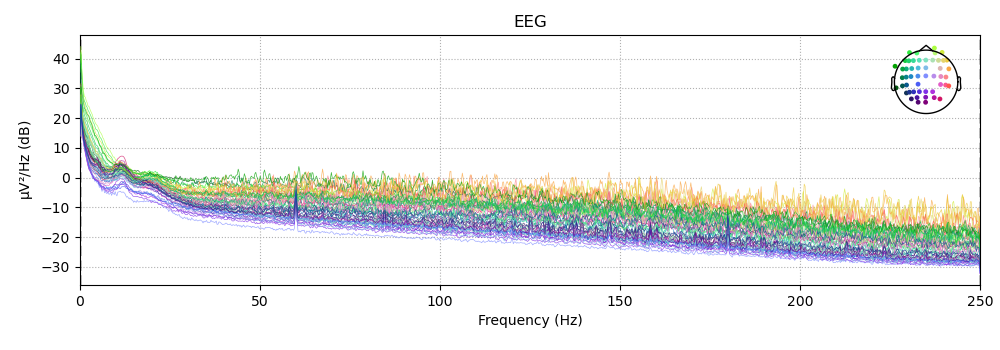

In [52]:
# plot power spectrum
subj4.plot_psd(show = False)

### Re-Referencing Subject 4

In [53]:
# re-reference
subj4.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-004-eeg-sub-004_task-PST_eeg.fdt, 53 x 719475 (1438.9 s), ~291.0 MB, data loaded>

### Filtering Subject 4
**Filter**: We will use a high pass-filter with a cutoff at 0.1 Hz across all of our subjects. We choose a cutoff of 0.1 Hz because neural signals oscillating below 0.1 Hz might be a recording corrupted by sweat. Effectively, this will remove unnecessary drift within our EEG data and isolate the high frequencies that we care about. In addition, we used a notch filter(band stop filter) to zero out the line noise at 60 Hz and its harmonics.

In [54]:
subj4 = subj4.filter(l_freq = 0.1, h_freq = None) # high pass filter with cutoff 0.1 Hz

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 16501 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.5s finished


In [55]:
subj4_filtered = subj4.notch_filter((np.arange(60, 241, 60))) # band stop filter removing line noise and harmonics

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.3s finished


<IPython.core.display.Javascript object>


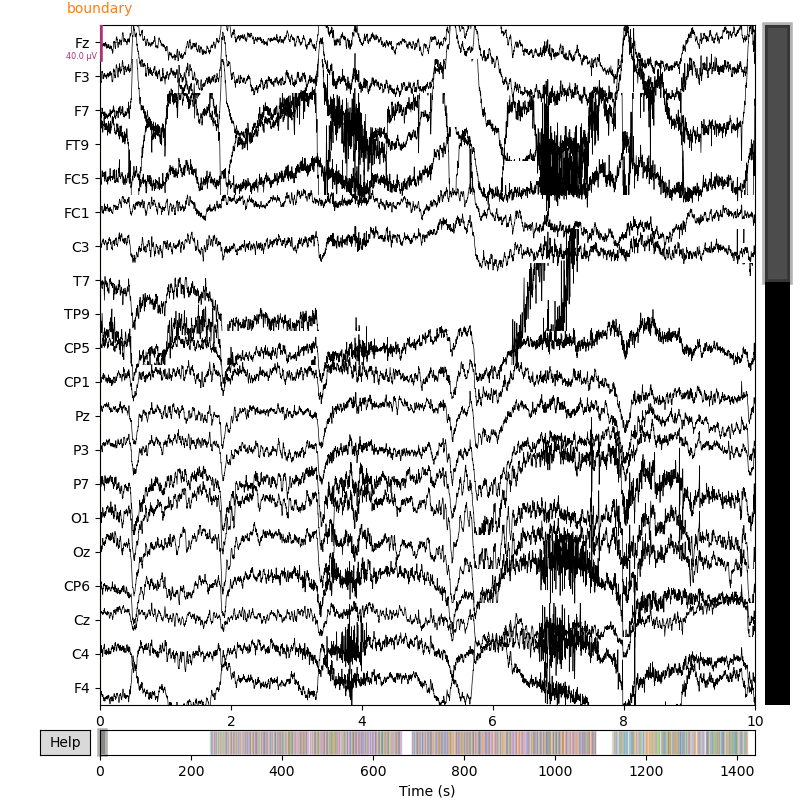

In [56]:
#raw.plot()

mne.viz.plot_raw(subj4_filtered, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


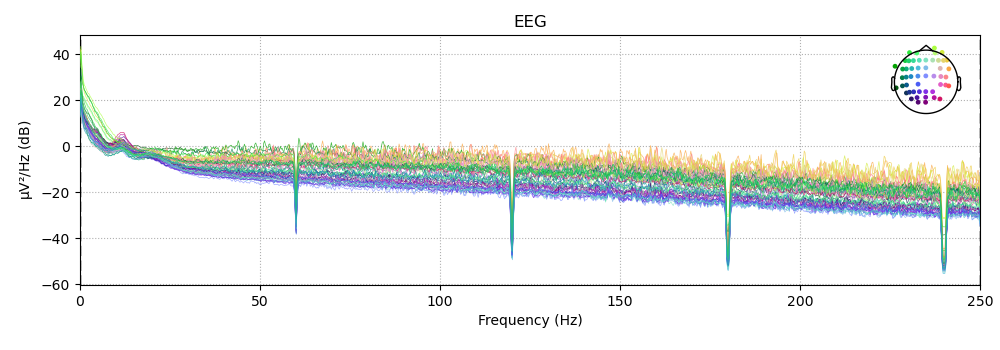

In [57]:
subj4_filtered.plot_psd(show = False)

In [58]:
subj4_filtered.save("/home/cmcmanig/FINALPROJECT/subj4_exp1_male_sad_filtered.fif", overwrite = True)

Overwriting existing file.
Writing /home/cmcmanig/FINALPROJECT/subj4_exp1_male_sad_filtered.fif


/tmp/ipykernel_973/2597362322.py:1: RuntimeWarning: This filename (/home/cmcmanig/FINALPROJECT/subj4_exp1_male_sad_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  subj4_filtered.save("/home/cmcmanig/FINALPROJECT/subj4_exp1_male_sad_filtered.fif", overwrite = True)


Closing /home/cmcmanig/FINALPROJECT/subj4_exp1_male_sad_filtered.fif
[done]


## Experiment 2 Pre-Processing

**Happy Manipulations:**

- Subject 6 (Female/Happy Stimulus)

- Subject 8 (Male/Happy Stimulus)

### Take a Look At Experiment 2 Logistics

In [59]:
experiment_2_logistics = pd.read_csv("participants2.tsv",  sep='\t')
experiment_2_logistics[5:8]

,participant_id,MoodManipulationGroup,sex,age,BDI
5,sub-006,Happy,Female,51,1
6,sub-007,Sad,Male,20,2
7,sub-008,Happy,Male,37,2


### Subject 6 (Female/Happy Stimulus)

In [60]:
subj6 = mne.io.read_raw_eeglab("sub-006_eeg_sub-006_task-PST_eeg.set", preload = True)
df6 = subj6.to_data_frame()

Reading /home/cmcmanig/FINALPROJECT/sub-006_eeg_sub-006_task-PST_eeg.fdt
Reading 0 ... 1577549  =      0.000 ...  3155.098 secs...


/tmp/ipykernel_973/4008401784.py:1: RuntimeWarning: Data file name in EEG.data (sub-006_task-PST_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-006_eeg_sub-006_task-PST_eeg.fdt).
  subj6 = mne.io.read_raw_eeglab("sub-006_eeg_sub-006_task-PST_eeg.set", preload = True)
/tmp/ipykernel_973/4008401784.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  subj6 = mne.io.read_raw_eeglab("sub-006_eeg_sub-006_task-PST_eeg.set", preload = True)


In [61]:
df6.head()

,time,Fp1,Fz,F3,F7,Below Eye,FC5,FC1,C3,T7,...,C2,FC4,FT8,F6,F2,AF4,AF8,Empty,EKG,AudioOutput
0,0.000,-6446.533203,-11824.951172,-6154.150391,-7645.751953,-18785.644531,-13511.035156,-16662.109375,-6856.640625,-20067.431641,...,-6100.927734,-2184.716797,-18189.990234,-21911.230469,-7640.283203,-13836.425781,-19252.246094,12576.580078,151161.843750,124918.523438
1,0.002,-6452.441406,-11825.927734,-6154.150391,-7649.023437,-18791.748047,-13507.568359,-16660.644531,-6843.994141,-20086.083984,...,-6098.632812,-2179.931641,-18218.994141,-21919.384766,-7642.236328,-13838.916016,-19265.722656,12556.016602,143838.234375,125168.859375
2,0.004,-6462.500000,-11831.689453,-6160.058594,-7658.935547,-18806.201172,-13512.060547,-16664.648438,-6843.896484,-20127.294922,...,-6098.779297,-2175.244141,-18251.123047,-21926.416016,-7645.117188,-13841.943359,-19293.652344,12510.716797,145374.531250,124605.000000
3,0.006,-6460.644531,-11831.591797,-6163.623047,-7660.693359,-18811.328125,-13513.330078,-16668.505859,-6860.449219,-20133.203125,...,-6097.558594,-2165.283203,-18226.660156,-21914.648438,-7640.576172,-13837.304688,-19289.550781,12489.557617,146718.328125,124115.351562
4,0.008,-6461.376953,-11834.277344,-6162.988281,-7662.109375,-18804.687500,-13512.353516,-16668.798828,-6865.625000,-20093.652344,...,-6097.412109,-2171.289062,-18235.449219,-21913.769531,-7643.994141,-13844.238281,-19290.185547,12505.352539,156908.031250,124269.125000


#### Take a Look at Recording Logistics

In [62]:
num_chan = subj6.info['nchan']
srate = subj6.info['sfreq']
num_time_pnts = subj6.n_times
duration = subj6.n_times / srate

print('Number of channels:', num_chan)
print('Sampling rate:', srate, "Hz")
print('Numer of time points:', num_time_pnts)
print('Duration:', duration, "seconds")

Number of channels: 66
Sampling rate: 500.0 Hz
Numer of time points: 1577550
Duration: 3155.1 seconds


In [63]:
subj6.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, Below Eye, FC5, FC1, C3, T7, Left Mastoid, CP5, ...
 chs: 66 EEG
 custom_ref_applied: False
 dig: 69 items (3 Cardinal, 66 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 66
 projs: []
 sfreq: 500.0 Hz
>

### Take a Look at Channels, Change Type of non-EEG channels, and Remove "Bad" Channels

In [64]:
# need to change channel type of non-EEG channels
subj6.info['ch_names']

['Fp1',
 'Fz',
 'F3',
 'F7',
 'Below Eye',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'Left Mastoid',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'Right Mastoid',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'Above Eye',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'FCz',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'F2',
 'AF4',
 'AF8',
 'Empty',
 'EKG',
 'AudioOutput']

In [65]:
channel_change = { 'Empty' : 'misc',
                     'EKG' : 'misc',
             'AudioOutput' : 'misc',
               'Below Eye' : 'misc',
            'Left Mastoid' : 'misc',
               'Above Eye' : 'misc',
           'Right Mastoid' : 'misc'} # non-EEG channels to misc

bad_channels = ['P4', 'CP3', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects

subj6.set_channel_types(channel_change)
subj6.drop_channels(bad_channels) #FT10 and TP10 not in experiment 2

subj6.set_montage('standard_1020', match_case = False) # set montage

/tmp/ipykernel_973/375337378.py:11: RuntimeWarning: The unit for channel(s) Above Eye, AudioOutput, Below Eye, EKG, Empty, Left Mastoid, Right Mastoid has changed from V to NA.
  subj6.set_channel_types(channel_change)


<RawEEGLAB | sub-006_eeg_sub-006_task-PST_eeg.fdt, 55 x 1577550 (3155.1 s), ~662.0 MB, data loaded>

### Plot the Raw Data and Power Spectrum
**Subject 6 Original Channel(s) marked as bad**: T8

- The Power Spectrum Density plot revealed that channel T8 was an outlier and should therefore be removed from our analysis due to being too noisy. However, after our first iteration of pre-processing, we used the drop channels call to remove all bad channels across our 6 subjects. Because channels TP10 and FT10 were not contained within experiment 2, experiment 2 subjects will have 48 good EEG channels.

<IPython.core.display.Javascript object>


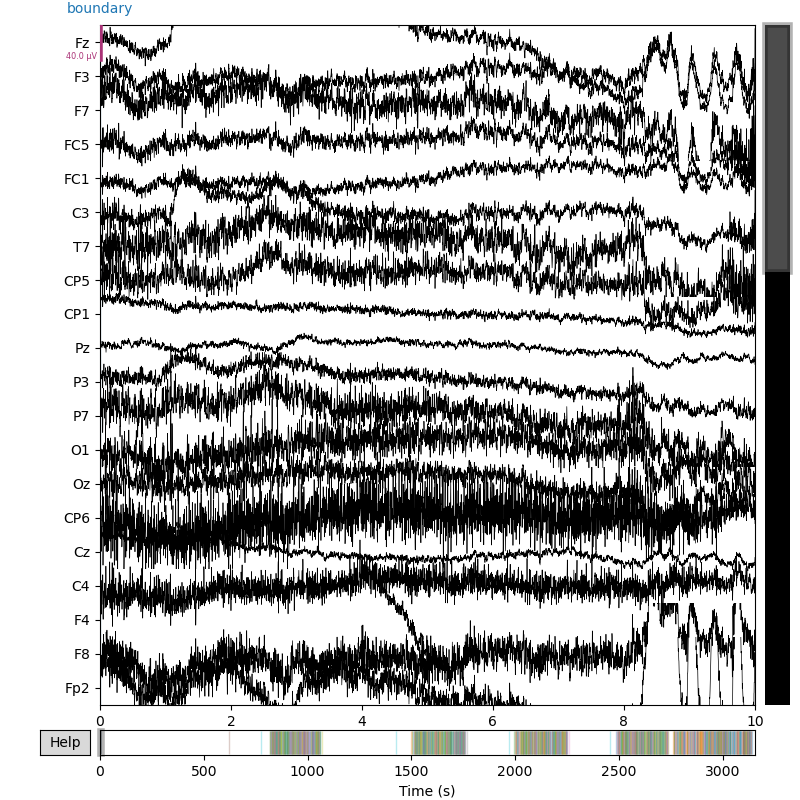

In [66]:
# plot raw data

mne.viz.plot_raw(subj6, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


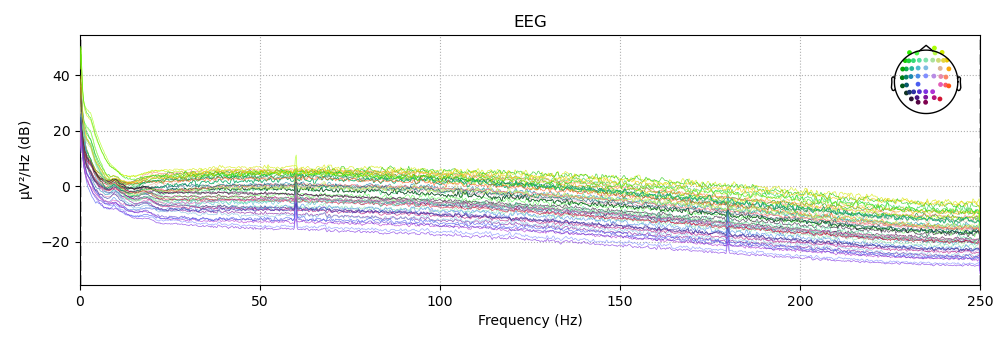

In [67]:
# plot power spectrum
subj6.plot_psd(show = False)

### Re-Referencing Subject 6

In [68]:
# re-reference
subj6.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-006_eeg_sub-006_task-PST_eeg.fdt, 55 x 1577550 (3155.1 s), ~662.0 MB, data loaded>

### Filtering Subject 6
**Filter**: We will use a high pass-filter with a cutoff at 0.1 Hz across all of our subjects. We choose a cutoff of 0.1 Hz because neural signals oscillating below 0.1 Hz might be a recording corrupted by sweat. Effectively, this will remove unnecessary drift within our EEG data and isolate the high frequencies that we care about. In addition, we used a notch filter(band stop filter) to zero out the line noise at 60 Hz and its harmonics.

In [69]:
subj6 = subj6.filter(l_freq = 0.1, h_freq = None) # high pass filter with cutoff 0.1 Hz

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 16501 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    3.2s finished


In [70]:
subj6_filtered = subj6.notch_filter((np.arange(60, 241, 60))) # band stop filter removing line noise and harmonics

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    2.7s finished


<IPython.core.display.Javascript object>


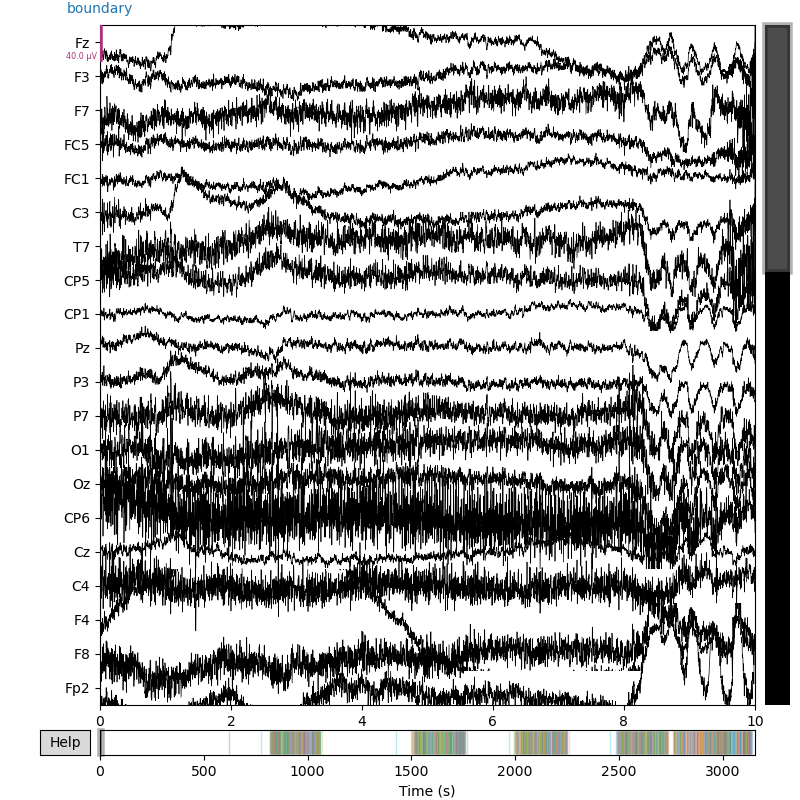

In [71]:
#raw.plot()

mne.viz.plot_raw(subj6_filtered, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


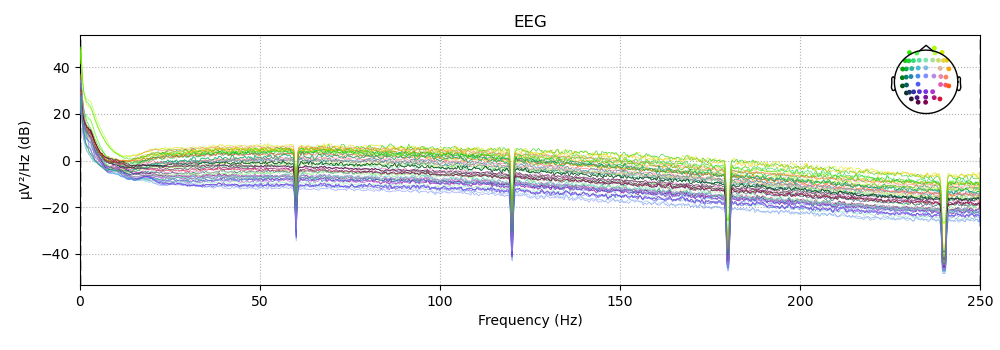

In [72]:
subj6_filtered.plot_psd(show = False)

In [73]:
subj6_filtered.save("/home/cmcmanig/FINALPROJECT/subj6_exp2_female_happy_filtered.fif", overwrite = True)

Writing /home/cmcmanig/FINALPROJECT/subj6_exp2_female_happy_filtered.fif


/tmp/ipykernel_973/2024193472.py:1: RuntimeWarning: This filename (/home/cmcmanig/FINALPROJECT/subj6_exp2_female_happy_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  subj6_filtered.save("/home/cmcmanig/FINALPROJECT/subj6_exp2_female_happy_filtered.fif", overwrite = True)


Closing /home/cmcmanig/FINALPROJECT/subj6_exp2_female_happy_filtered.fif
[done]


### Subject 8 (Male/Happy Stimulus)

In [74]:
subj8 = mne.io.read_raw_eeglab("sub-008_eeg_sub-008_task-PST_eeg.set", preload = True)
df8 = subj8.to_data_frame()

Reading /home/cmcmanig/FINALPROJECT/sub-008_eeg_sub-008_task-PST_eeg.fdt
Reading 0 ... 1283749  =      0.000 ...  2567.498 secs...


/tmp/ipykernel_973/2536080739.py:1: RuntimeWarning: Data file name in EEG.data (sub-008_task-PST_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-008_eeg_sub-008_task-PST_eeg.fdt).
  subj8 = mne.io.read_raw_eeglab("sub-008_eeg_sub-008_task-PST_eeg.set", preload = True)
/tmp/ipykernel_973/2536080739.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  subj8 = mne.io.read_raw_eeglab("sub-008_eeg_sub-008_task-PST_eeg.set", preload = True)


In [75]:
df8.head()

,time,Fp1,Fz,F3,F7,Below Eye,FC5,FC1,C3,T7,...,C2,FC4,FT8,F6,F2,AF4,AF8,Empty,EKG,AudioOutput
0,0.000,12013.281250,-2351.367188,7675.634766,4021.582031,13190.625000,-562.792969,7510.595703,2794.482422,6632.568359,...,5893.847656,2221.044922,-700.634766,11911.962891,14206.884766,14327.587891,12917.919922,12900.531250,-156635.343750,129971.203125
1,0.002,12011.816406,-2348.779297,7679.345703,4021.386719,13177.099609,-556.005859,7511.718750,2798.974609,6633.007812,...,5894.628906,2220.166016,-706.005859,11901.855469,14204.785156,14327.197266,12916.210937,12765.526367,-156021.125000,130287.703125
2,0.004,12010.644531,-2346.240234,7683.007812,4024.511719,13173.583984,-547.851562,7514.111328,2804.980469,6637.841797,...,5895.751953,2221.337891,-700.488281,11906.054687,14205.371094,14329.150391,12920.751953,12570.321289,-155460.234375,130285.320312
3,0.006,12007.421875,-2345.703125,7684.130859,4023.144531,13174.951172,-545.166016,7515.332031,2807.568359,6634.814453,...,5896.191406,2221.630859,-699.365234,11910.107422,14207.373047,14327.099609,12922.607422,12500.286133,-155314.203125,129530.726562
4,0.008,11999.658203,-2344.677734,7683.691406,4026.220703,13171.923828,-539.599609,7517.333984,2809.179688,6632.666016,...,5897.509766,2219.677734,-706.054688,11901.708984,14205.566406,14325.683594,12921.142578,12528.001953,-154866.281250,128875.671875


#### Take a Look at Recording Logistics

In [76]:
num_chan = subj8.info['nchan']
srate = subj8.info['sfreq']
num_time_pnts = subj8.n_times
duration = subj8.n_times / srate

print('Number of channels:', num_chan)
print('Sampling rate:', srate, "Hz")
print('Numer of time points:', num_time_pnts)
print('Duration:', duration, "seconds")

Number of channels: 66
Sampling rate: 500.0 Hz
Numer of time points: 1283750
Duration: 2567.5 seconds


In [77]:
subj8.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, Below Eye, FC5, FC1, C3, T7, Left Mastoid, CP5, ...
 chs: 66 EEG
 custom_ref_applied: False
 dig: 69 items (3 Cardinal, 66 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 66
 projs: []
 sfreq: 500.0 Hz
>

### Take a Look at Channels, Change Type of non-EEG channels, and Remove "Bad" Channels

In [78]:
# need to change channel type of non-EEG channels
subj8.info['ch_names']

['Fp1',
 'Fz',
 'F3',
 'F7',
 'Below Eye',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'Left Mastoid',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'Right Mastoid',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'Above Eye',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'FCz',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'F2',
 'AF4',
 'AF8',
 'Empty',
 'EKG',
 'AudioOutput']

In [79]:
channel_change = { 'Empty' : 'misc',
                     'EKG' : 'misc',
             'AudioOutput' : 'misc',
               'Below Eye' : 'misc',
            'Left Mastoid' : 'misc',
               'Above Eye' : 'misc',
           'Right Mastoid' : 'misc'} # non-EEG channels to misc

bad_channels = ['P4', 'CP3', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects

subj8.set_channel_types(channel_change)
subj8.drop_channels(bad_channels) #FT10 and TP10 not in experiment 2

subj8.set_montage('standard_1020', match_case = False) # set montage

/tmp/ipykernel_973/1926314044.py:11: RuntimeWarning: The unit for channel(s) Above Eye, AudioOutput, Below Eye, EKG, Empty, Left Mastoid, Right Mastoid has changed from V to NA.
  subj8.set_channel_types(channel_change)


<RawEEGLAB | sub-008_eeg_sub-008_task-PST_eeg.fdt, 55 x 1283750 (2567.5 s), ~538.8 MB, data loaded>

### Plot the Raw Data and Power Spectrum
**Subject 8 Original Channel(s) marked as bad**: P8

- The Power Spectrum Density plot revealed that channel P8 was an outlier and should therefore be removed from our analysis due to being too noisy. However, after our first iteration of pre-processing, we used the drop channels call to remove all bad channels across our 6 subjects. This left us with 48 good EEG channels for experiment 2 subjects.

/home/cmcmanig/.local/lib/python3.9/site-packages/mne/viz/_mpl_figure.py:2145: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(FigureClass=FigureClass, **kwargs)


<IPython.core.display.Javascript object>


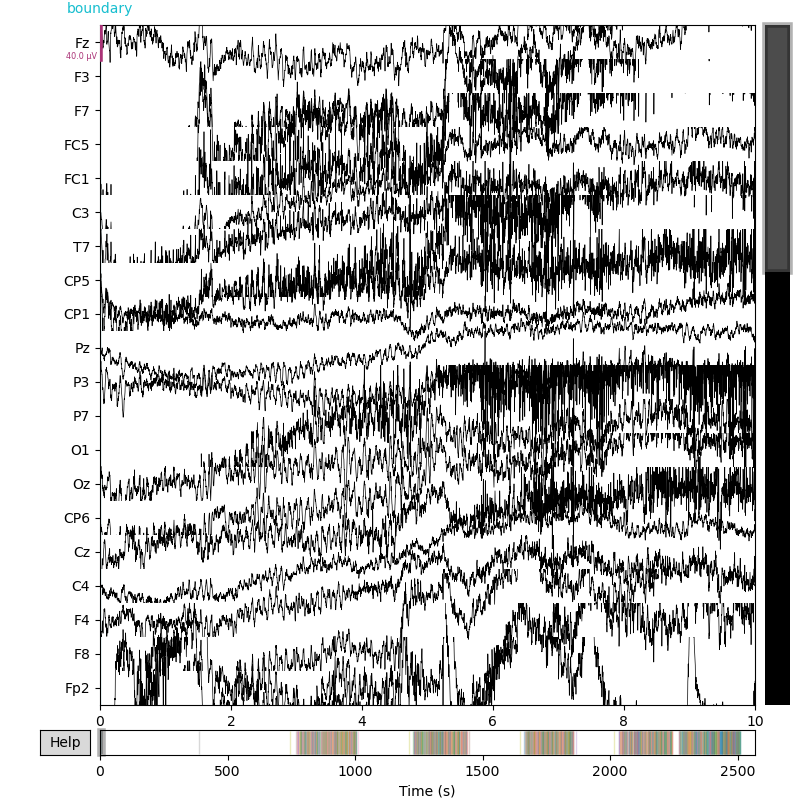

In [80]:
# plot raw data

mne.viz.plot_raw(subj8, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


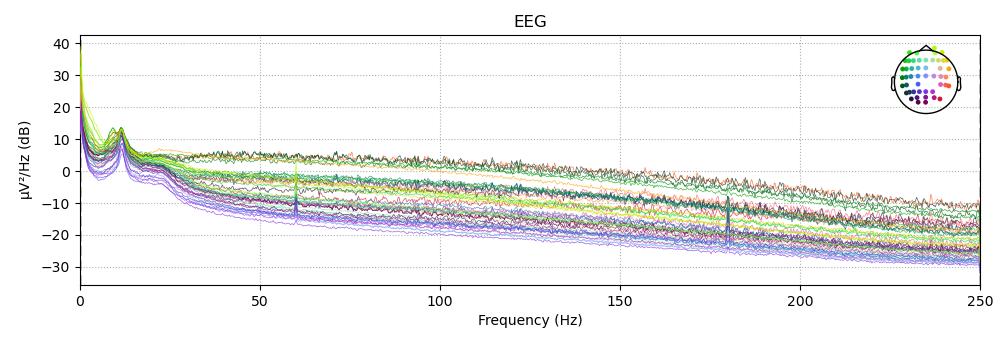

In [81]:
# plot power spectrum

subj8.plot_psd(show = False)

### Re-Referencing Subject 8

In [82]:
# re-reference
subj8.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-008_eeg_sub-008_task-PST_eeg.fdt, 55 x 1283750 (2567.5 s), ~538.8 MB, data loaded>

### Filtering Subject 8
**Filter**: We will use a high pass-filter with a cutoff at 0.1 Hz across all of our subjects. We choose a cutoff of 0.1 Hz because neural signals oscillating below 0.1 Hz might be a recording corrupted by sweat. Effectively, this will remove unnecessary drift within our EEG data and isolate the high frequencies that we care about. In addition, we used a notch filter(band stop filter) to zero out the line noise at 60 Hz and its harmonics.

In [83]:
subj8 = subj8.filter(l_freq = 0.1, h_freq = None) # high pass filter with cutoff 0.1 Hz

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 16501 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    2.5s finished


In [84]:
subj8_filtered = subj8.notch_filter((np.arange(60, 241, 60))) # band stop filter removing line noise and harmonics

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    2.2s finished


<IPython.core.display.Javascript object>


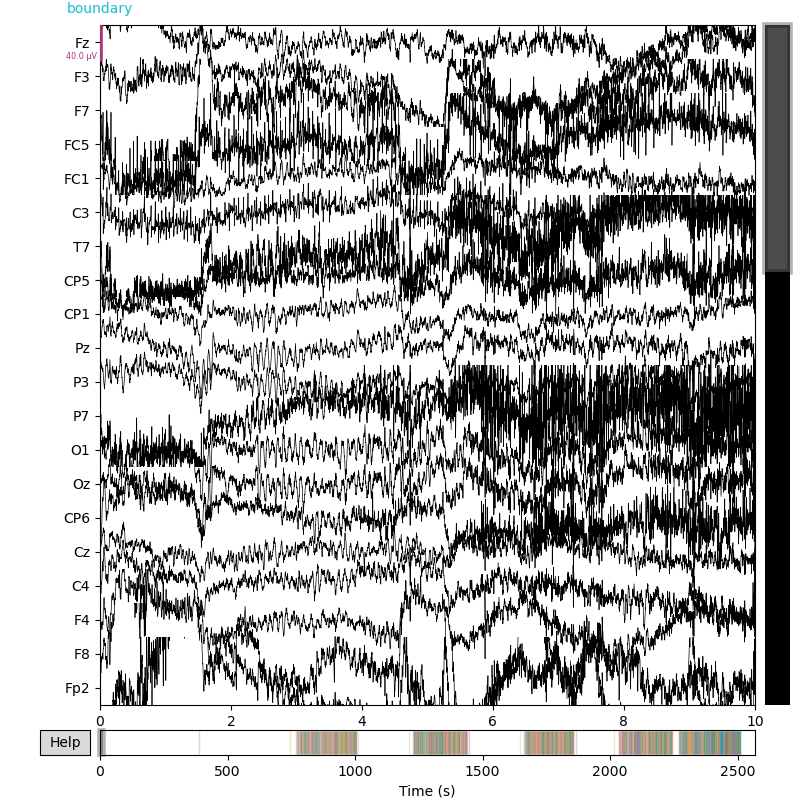

In [85]:
#raw.plot()

mne.viz.plot_raw(subj8, show = False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


<IPython.core.display.Javascript object>


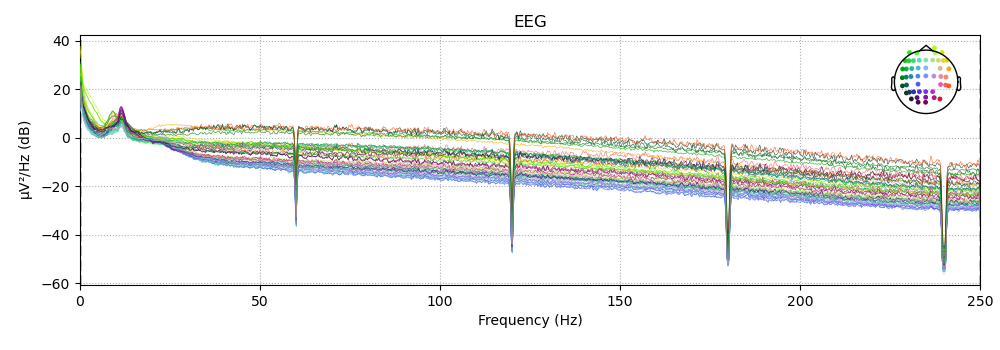

In [86]:
subj8_filtered.plot_psd(show = False)

In [87]:
subj8_filtered.save("/home/cmcmanig/FINALPROJECT/subj8_exp2_male_happy_filtered.fif", overwrite = True)

Writing /home/cmcmanig/FINALPROJECT/subj8_exp2_male_happy_filtered.fif


/tmp/ipykernel_973/3609071653.py:1: RuntimeWarning: This filename (/home/cmcmanig/FINALPROJECT/subj8_exp2_male_happy_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  subj8_filtered.save("/home/cmcmanig/FINALPROJECT/subj8_exp2_male_happy_filtered.fif", overwrite = True)


Closing /home/cmcmanig/FINALPROJECT/subj8_exp2_male_happy_filtered.fif
[done]


### Check for Common and Good Channels Across Both Experiments

In [88]:
exp1 = subj1.info['ch_names'] # some channels from experiment 1
exp2 = subj6.info['ch_names'] # some channels from experiment 2

common_channels = []

for channel in exp1:
    if channel in exp2:
        common_channels.append(channel)

print("Common channels:", common_channels) # 61 common channels

Common channels: ['Fz', 'F3', 'F7', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'CP6', 'Cz', 'C4', 'F4', 'F8', 'Fp2', 'AF7', 'AF3', 'F1', 'F5', 'FT7', 'FC3', 'FCz', 'C1', 'C5', 'TP7', 'P1', 'P5', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'P2', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'F2', 'AF4', 'AF8', 'EKG', 'AudioOutput']


In [89]:
bad_channels = ['P4', 'CP3', 'FT10', 'TP10', 'FC6', 'O2', 'FC2', 'AFz', 'P6', 'Fp1', 'CP2', 'T8', 'P8'] # bad channels across our 6 subjects
good_channels = []

for channel in common_channels:
    if channel not in bad_channels:
        good_channels.append(channel)
        
print("Good Channels:", good_channels) # 50 good channels

Good Channels: ['Fz', 'F3', 'F7', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'CP6', 'Cz', 'C4', 'F4', 'F8', 'Fp2', 'AF7', 'AF3', 'F1', 'F5', 'FT7', 'FC3', 'FCz', 'C1', 'C5', 'TP7', 'P1', 'P5', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'P2', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'F2', 'AF4', 'AF8', 'EKG', 'AudioOutput']
